### Import Data


Text(0.5, 1.0, 'Sonar2')

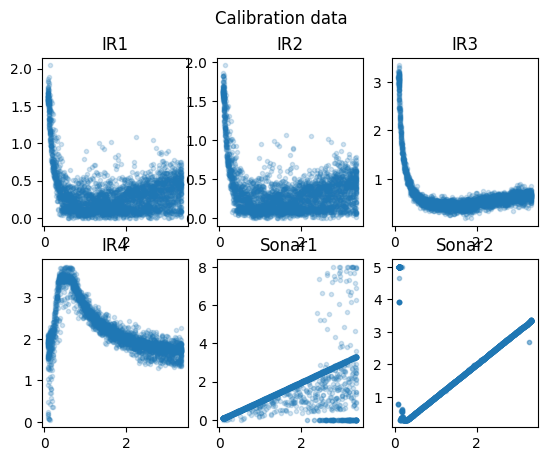

In [1]:
import numpy as np
import scipy as sp
matplotlib.style.use('default')  # Graph white background 
import matplotlib.pyplot as plt

# Load data
filename = 'partA/calibration.csv'
data = np.loadtxt(filename, delimiter=',', skiprows=1)

# Split into columns
index, time, distance, velocity_command, raw_ir1, raw_ir2, raw_ir3, raw_ir4, \
    sonar1, sonar2 = data.T


fig, axes = plt.subplots(2, 3)
fig.suptitle('Calibration data')

axes[0, 0].plot(distance, raw_ir1, '.', alpha=0.2)
axes[0, 0].set_title('IR1')

axes[0, 1].plot(distance, raw_ir2, '.', alpha=0.2)
axes[0, 1].set_title('IR2')

axes[0, 2].plot(distance, raw_ir3, '.', alpha=0.2)
axes[0, 2].set_title('IR3')

axes[1, 0].plot(distance, raw_ir4, '.', alpha=0.2)
axes[1, 0].set_title('IR4')

axes[1, 1].plot(distance, sonar1, '.', alpha=0.2)
axes[1, 1].set_title('Sonar1')

axes[1, 2].plot(distance, sonar2, '.', alpha=0.2)
axes[1, 2].set_title('Sonar2')


# IR 1

## Raw Data

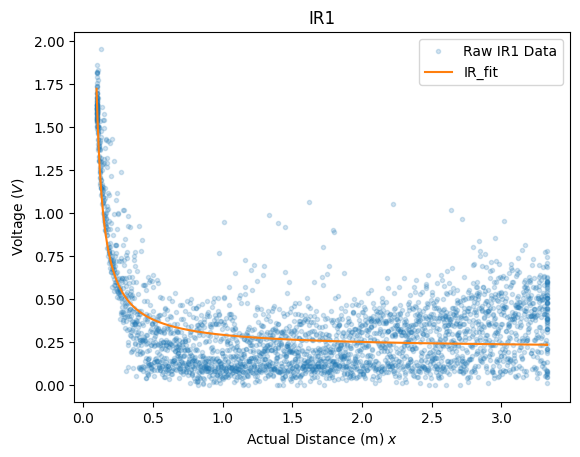

In [2]:
# import Model.IR_senosr_model as IR

def ir1_model(x,a,b,c):
    return a/(x + b) + c

ir1_params, cov = sp.optimize.curve_fit(ir1_model,distance,raw_ir1)
ir1_fit =ir1_model(distance, *ir1_params)

fig,ax = plt.subplots(1)
ax.plot(distance,raw_ir2,'.',alpha=0.2,label='Raw IR1 Data')
ax.plot(distance,ir1_fit,label = 'IR_fit')

# title 
ax.set_title(r"IR1")
ax.set_xlabel(r"Actual Distance (m) $x$")
ax.set_ylabel(r"Voltage $(V)$")
ax.legend()

## Filter

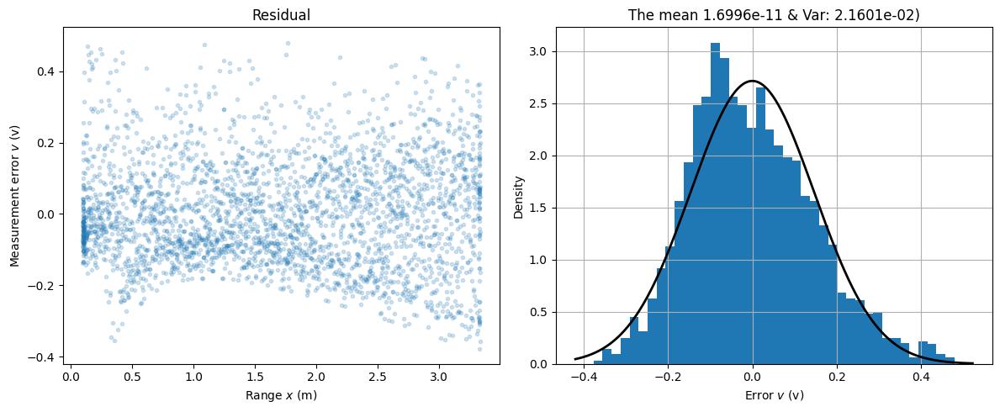

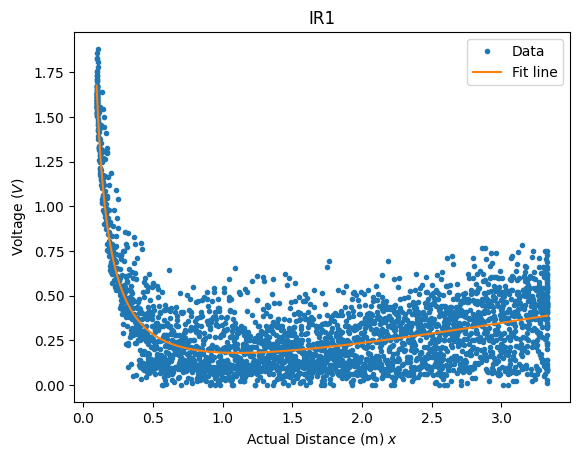

In [3]:
# from Model.IR_model import remove_outliter
import Model.IR_model as mm

# remove_outliter(ir1_model,distance,raw_ir1)

ir1_x, ir1_v,ir1_fit,ir1_params= mm.remove_outlier(mm.ir3_model,distance,raw_ir1,3)

err_ir1 = ir1_v - ir1_fit 

mm.Residual_and_Histogram(ir1_x,ir1_v,ir1_fit)
mm.plot_fit_line(ir1_x,ir1_v,ir1_fit,"IR1")

# print(ir1_cov)

# Guassian Distrubution



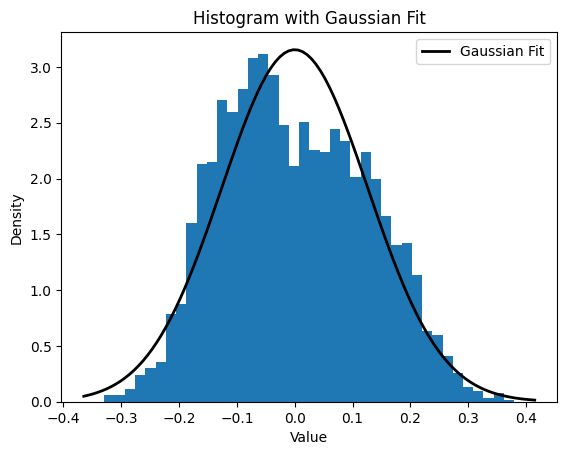

3.569647692666524e-11
0.015991127803371676


In [6]:
from sklearn import metrics

# std_ir1 = np.std(err_ir1)
# print(std_ir1)


# plt.hist(err_ir1, bins=40, density=True)
# plt.set_xlabel("Error $v$ (v)")
# plt.set_ylabel("Density")
# plt.set_title("Histogram")
# plt.grid()


import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm

err_ir1 = ir1_v - ir1_fit 


# err_ir1 = ir2_v - ir2_fit 
# import numpy as np
# import matplotlib.pyplot as plt
# from scipy.stats import norm


data = err_ir1
# 绘制直方图
# plt.hist(data, bins=30, density=True, alpha=0.6, color='b', label='Histogram')
plt.hist(data, bins=40, density=True)
# 计算拟合的高斯分布参数
mu, std = norm.fit(data)

# 绘制高斯分布的概率密度函数
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)
p = norm.pdf(x, mu, std)
plt.plot(x, p, 'k', linewidth=2, label='Gaussian Fit')

# 添加标签和标题
plt.xlabel('Value')
plt.ylabel('Density')
plt.title('Histogram with Gaussian Fit')
plt.legend()

# 显示图形
plt.show()


    
print(mu)
print(std**2)

# IR 2

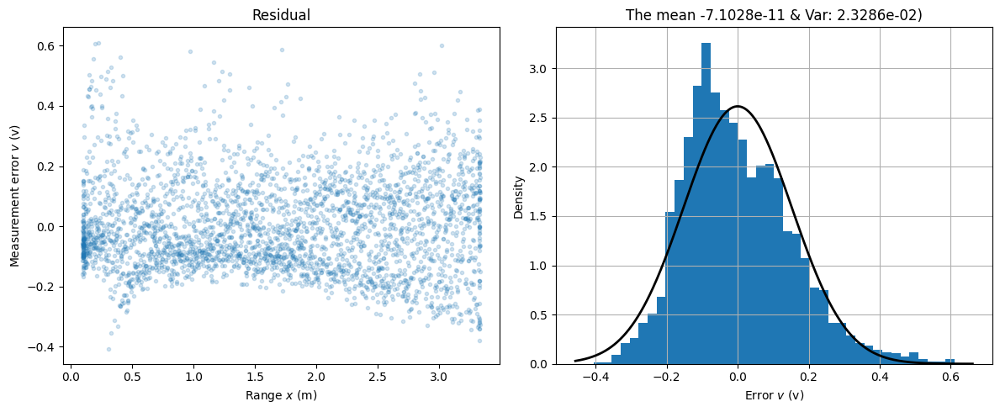

ValueError: too many values to unpack (expected 2)

In [3]:
# import Model.IR_model as mm
import Model.IR_model as mm
from scipy.stats import norm

ir2_x, ir2_v,ir2_fit, IR_model_params= mm.remove_outlier(mm.ir3_model,distance ,raw_ir2,4)


    



# mm.plot_fit_line(ir2_x,ir2_v,ir2_fit,"IR2")
ir2_mu, ir2_std = mm.Residual_and_Histogram(ir2_x,ir2_v,ir2_fit)



# data = ir2_v - ir2_fit 
# # import numpy as np
# # import matplotlib.pyplot as plt
# # from scipy.stats import norm


# # 绘制直方图
# # plt.hist(data, bins=30, density=True, alpha=0.6, color='b', label='Histogram')
# plt.hist(data, bins=20, density=True)
# # 计算拟合的高斯分布参数
# mu, std = norm.fit(data)

# # 绘制高斯分布的概率密度函数
# # xmin, xmax = plt.xlim()
# x = np.linspace(xmin, xmax, 400)
# p = norm.pdf(x, mu, std)
# plt.plot(x, p, 'k', linewidth=2, label='Gaussian Fit')

# # 添加标签和标题
# plt.xlabel('Value')
# plt.ylabel('Density')
# plt.title('Histogram with Gaussian Fit')
# plt.legend()

# # 显示图形
# plt.show()

# print(mu)
# print(std**2)



# IR 3

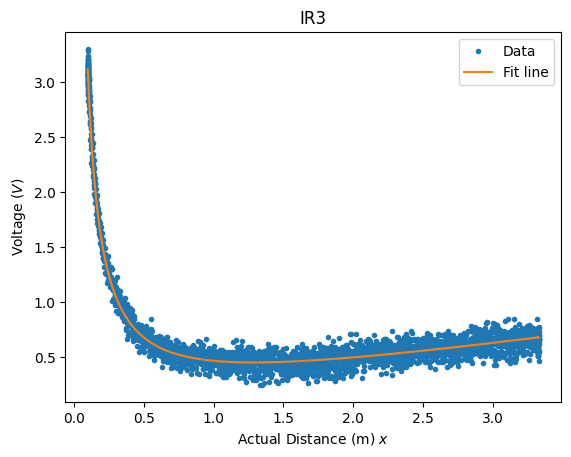

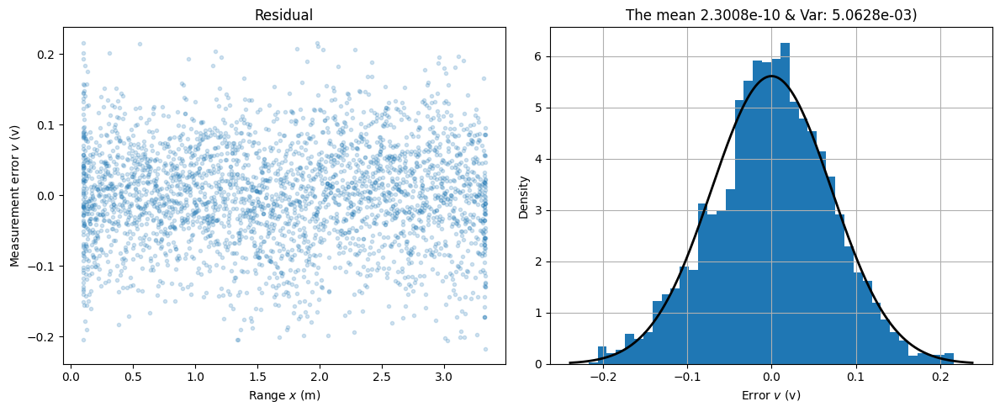

(2.3007944583037878e-10,
 0.07115350693860763,
 array([ 0.08377052, -0.12965847, -0.01512255, ..., -0.17264871,
        -0.06023447,  0.0130804 ]))

In [4]:
import Model.IR_model as mm
ir3_x, ir3_v,ir3_fit,ir3_params= mm.remove_outlier(mm.ir3_model,distance,raw_ir3,3)

mm.plot_fit_line(ir3_x,ir3_v,ir3_fit,"IR3")
mm.Residual_and_Histogram(ir3_x,ir3_v,ir3_fit)

## Sonar 1


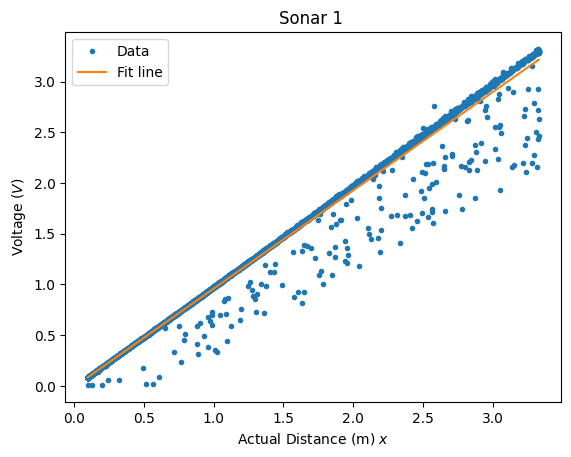

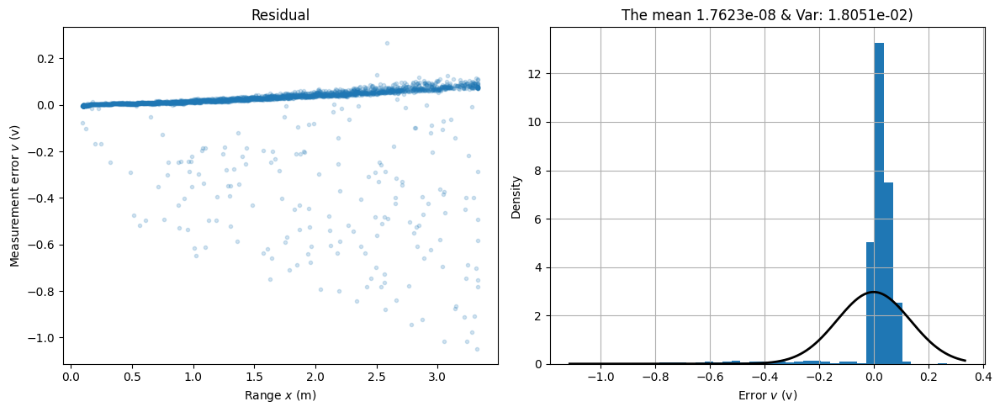

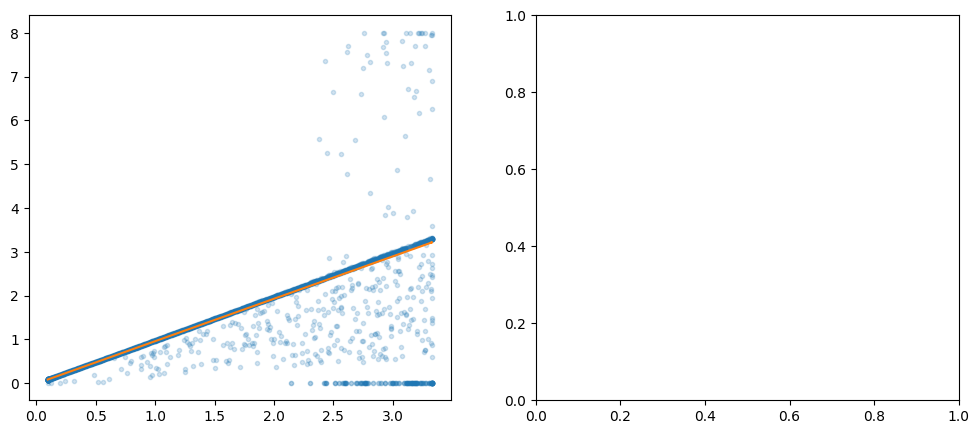

In [24]:
import numpy as np 

def sn1_model(x,a,b,c):
    return a*x + c


import Model.IR_model as mm
sn1_x, sn1_v,sn1_fit,sn1_params= mm.remove_outlier(mm.sn1_model,distance,sonar1,0.7)
# sn1_x, sn1_v,sn1_fit,sn1_params= mm.remove_outlier(sn1_model,distance,sonar1,0.5)

# sn1
mm.plot_fit_line(sn1_x,sn1_v,sn1_fit,"Sonar 1 ")
mm.Residual_and_Histogram(sn1_x,sn1_v,sn1_fit)

fig, ax = plt.subplots(1, 2, figsize=(12, 5))  # Specify figsize

ax[0].plot(distance ,sonar1,'.',alpha = 0.2)
ax[0].plot(sn1_x,sn1_fit)


# IR 4

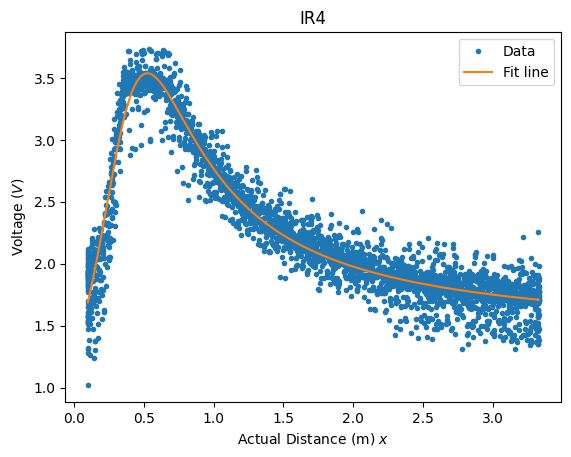

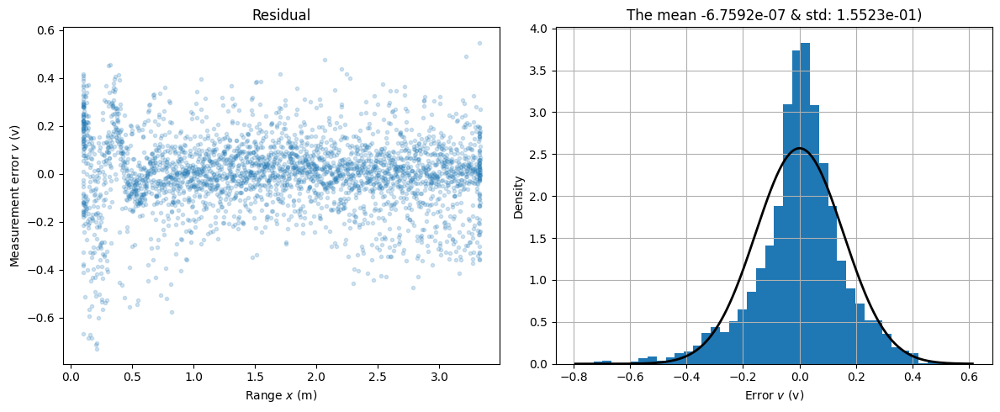

(-6.759212760070293e-07, 0.15522715142259266)

In [6]:
import Model.IR_model as mm
ir4_x, ir4_v,ir4_fit,ir4_params= mm.remove_outlier(mm.ir4_model,distance,raw_ir4,3)

mm.plot_fit_line(ir4_x,ir4_v,ir4_fit,"IR4")
mm.Residual_and_Histogram(ir4_x,ir4_v,ir4_fit)

# 1.2 Motion model

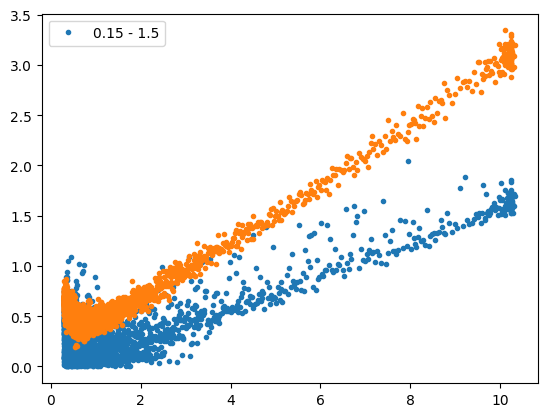

In [10]:
# mm.plot_fit_line(ir1_x,1/ir1_v,1/ir1_fit,"IR1")
# mm.plot_fit_line(ir2_x,1/ir2_v,1/ir2_fit,"IR2")
# mm.plot_fit_line(ir4_x,1/ir4_v,1/ir4_fit,"IR4")
# mm.plot_fit_line(ir4_x,1/ir4_v,1/ir4_fit,"IR4")

fig, ax = plt.subplots(1)
# ax.set_xlabel(r"Actual Distance (m) $x$"
# 
# # ax.set_ylabel(r"Voltage $(V)$")

# A = [0.15,1.5]

ax.plot(1/distance,raw_ir1, '.', alpha=1, label='0.15 - 1.5')


ax.plot(1/ir1_x, ir1_v,'.')
# ax.plot(1/ir2_x,ir2_fit, '.', alpha=1, label='0.04 - 0.3')
# ax.plot(1/ir3_x,ir3_fit, '.', alpha=1, label='0.1 - 0.8')
# ax.axvline(x=A[0], color='r', linestyle='--', label='Vertical Line')
# ax.axvline(x=A[1], color='r', linestyle='--', label='Vertical Line')

#********************* IR 4 ************************************
# ax.plot(1/ir4_x,ir4_fit, '.', alpha=1, label='1-5')
# ax.axvline(x=2, color='r', linestyle='--', label='Vertical Line')
# ax.axvline(x=6, color='r', linestyle='--', label='Vertical Line')


# ax.plot(x, fit, label='Fit line')
ax.legend()  # Add a legend
        


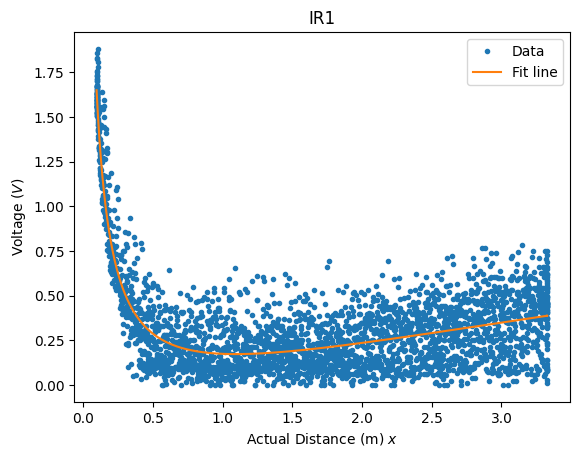

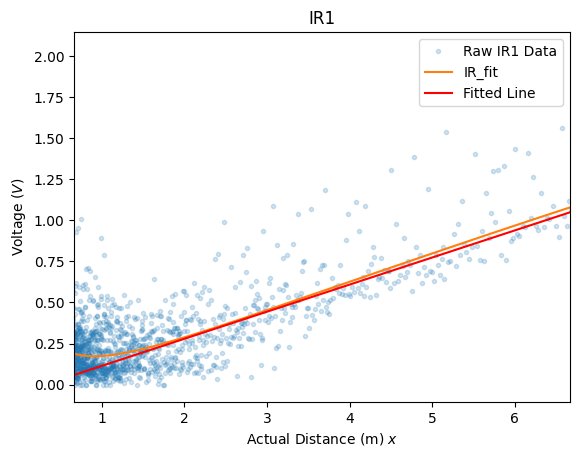

In [11]:
import Model.IR_model as mm
ir1_x, ir1_v,ir1_fit,ir1_params= mm.remove_outlier(mm.ir4_model,distance,raw_ir1,3)

mm.plot_fit_line(ir1_x,ir1_v,ir1_fit,"IR1")
# mm.Residual_and_Histogram(ir1_x,ir1_v,ir1_fit)


## Iverse 
xx = 1/ir1_x 

fig,ax = plt.subplots(1)
ax.plot(1/distance,raw_ir1,'.',alpha=0.2,label='Raw IR1 Data')

ax.plot(1/ir1_x,ir1_fit,label = 'IR_fit')

def mymode(x):
    return 0.165* x -0.0511317
predicted_y = mymode(xx)
plt.plot(xx, predicted_y, color='red', label='Fitted Line')
plt.xlim(1/1.5, 1/0.15)
# title 
ax.set_title(r"IR1")
ax.set_xlabel(r"Actual Distance (m) $x$")
ax.set_ylabel(r"Voltage $(V)$")

ax.legend()




# IR H_inverse V vs L

In [4]:
import Model.IR_model as mm
ir2_x, ir2_v,ir2_fit,ir2_params= mm.remove_outlier(mm.ir4_model,distance,raw_ir2,3)

mm.plot_fit_line(ir2_x,ir2_v,ir2_fit,"IR2")
# mm.Residual_and_Histogram(ir1_x,ir1_v,ir1_fit)


## Iverse 
xx = 1/ir2_x 

fig,ax = plt.subplots(1)
ax.plot(1/distance,raw_ir2,'.',alpha=0.2,label='Raw IR1 Data')

ax.plot(1/ir2_x,ir2_fit,label = 'IR_fit')

# def mymode(x):
    # return 0.165* x -0.0511317
# predicted_y = mymode(xx)
# plt.plot(xx, predicted_y, color='red', label='Fitted Line')
# plt.xlim(1/1.5, 1/0.15)
# title 
ax.set_title(r"IR2")
ax.set_xlabel(r"Actual Distance (m) $x$")
ax.set_ylabel(r"Voltage $(V)$")

ax.legend()




NameError: name 'distance' is not defined

## IR2 




In [5]:
import scipy as sp

y_raw = raw_ir3

y_fit = ir3_fit
x_fit = ir3_x

def david_line(x,a,b):
    return a * x + b


params, cov = sp.optimize.curve_fit(david_line, 1/x_fit, y_fit)
david_fit = david_line( 1/x_fit, *params)


def myLS1(xvals, yvals):
    """
    linear least squares
    """
    x = np.array([xvals])
    y = np.array([yvals]).T
    o = np.array([np.ones(len(xvals))])
    A = np.concatenate((x, o), axis=0).T
    # print(A)
    m, c = np.linalg.lstsq(A, y, rcond=None)[0]
    return m, c


k = myLS1(1/distance,y_raw)
k1 = myLS1(1/x_fit,y_fit)


def my_line(k,x):
    return k[1] * x + k[0]


xx = 1/x_fit ; yy = y_fit


# params, cov = sp.optimize.curve_fit(model1, xx, yy)
# yy = model1(xx, *params)

# fig, ax = plt.subplots(1,2)
fig, ax = plt.subplots(1, 2, figsize=(12, 5))  # Specify figsize
# data point 
ax[0].plot(1/distance,y_raw, '.', alpha=1, label='original data')
# original data fit

ax[0].plot(xx,yy, '.', alpha=1, label='filtered data')
ax[0].plot(1/distance,my_line(k,1/distance) - 0.2)


# filtered data
ax[1].plot(xx,yy, '.', alpha=1, label='filtered data')
# filtered data fit

ax[1].plot(1/x_fit,my_line(k1,1/x_fit))
ax[1].plot(1/x_fit,david_fit)

ax[0].legend()
ax[1].legend()


NameError: name 'raw_ir3' is not defined

ValueError: x and y must have same first dimension, but have shapes (3023,) and (2990,)

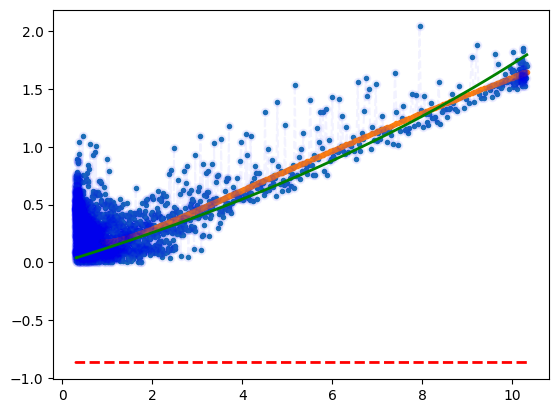

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import scipy as sp


import Model.IR_model as mm
ir1_x, ir1_v,ir1_fit,ir1_params= mm.remove_outlier(mm.ir4_model,distance,raw_ir1,3)


# Define your model function
def model1(x, P):
    return P[1] + (P[0] / (x + P[2]))

def calculate_A(x):
    N = len(x)
    A = np.ones((N, 3))
    A[:, 1] = 1.0 / x
    return A

def model_least_squares_fit(x, v):
    A = calculate_A(x)
    P, res, rank, s = np.linalg.lstsq(A, v, rcond=-1)
    return P

# Assuming 'distance', 'raw_ir3', 'ir1_x', and 'ir1_v' are defined
x = distance
# v = ir1_fit
v = raw_ir1

P = model_least_squares_fit(x, v)

P_rlm = [0.12, 0.0016, -0.03]

v1 = model1(x, P)
v2 = model1(x, P_rlm)

fig = plt.figure(1)
ax = fig.add_subplot(111)

ax.plot(1 / x, raw_ir1 ,'.', linewidth=2, label="original data")
# ax.plot(1 / x, ir1_fit , linewidth=2, label="filted data")

ax.plot(1 / ir1_x, ir1_fit ,'.', label="filted data")

ax.plot(1 / x, v, 'bo', linestyle='--', alpha=0.05)
ax.plot(1 /x, v1, 'red', linestyle='--', linewidth=2)
ax.plot(1 / x, v2, 'green', linewidth=2)


ir1_y_fit = mm.ir4_model(ir1_x,*ir1_params)
ax.plot(1 / x, ir1_y_fit, linewidth=2)

# print(ir1_params)


# Add labels and legend
ax.set_xlabel(r"Inverse of Distance $1/x$")
ax.set_ylabel("y")
ax.set_title("Linear Regression Example")
ax.legend()

# Show the plots
plt.show()





In [ ]:
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt

def mymode(x):
    return 0.17* x -0.0511317

def mymode2(x):
    return 0.13124 * x + 0.16337

# Sample data
xx = 1/ir1_x ; yy = ir1_fit

# ********************************************
plt.plot(1/distance,raw_ir1, '.', alpha=1, label='original data')

plt.plot(1/ir1_x, ir1_fit,'.',label='filted data')




# Create and fit the linear regression model
model = LinearRegression()
model.fit(xx.reshape(-1, 1), yy.reshape(-1, 1))

# Print model parameters
print('a={:.5}'.format(model.coef_[0][0]))
print('b={:.5}'.format(model.intercept_[0]))
print('线性模型：Y={:.5}X+{:.5}'.format(model.coef_[0][0], model.intercept_[0]))

# Predicted values using the model
predicted_y = mymode(xx)
my_y = mymode2(xx)


# Plot the original data points and the fitted line
# plt.scatter(xx, yy, label='Original Data')
plt.plot(xx, predicted_y, color='red', label='Fitted Line')
plt.plot(xx, my_y, label='Fitted Line')
plt.xlabel('X')
plt.ylabel('Y')
plt.title('Linear Regression')
plt.legend()
plt.show()




NameError: name 'ir1_x' is not defined

In [ ]:
def myLS1(xvals, yvals):
    """
    linear least squares
    """
    x = np.array([xvals])
    y = np.array([yvals]).T
    o = np.array([np.ones(len(xvals))])
    A = np.concatenate((x, o), axis=0).T
    # print(A)
    m, c = np.linalg.lstsq(A, y, rcond=None)[0]
    return m, c


k = myLS1(xx,yy)

def my_line(k):
    return k[0] * x + k[1]




NameError: name 'xx' is not defined

In [ ]:
original_array = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
one_third = len(original_array) // 3
result_array = original_array[one_third:]

print(result_array)


## TEST H_inverse

## IR3 H_inverse

(array([0.24649511]), array([0.3679746]))


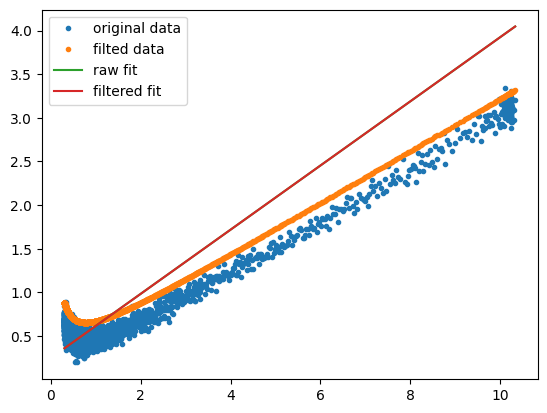

In [ ]:
# ********************************************



def myLS1(xvals, yvals):
    """
    linear least squares
    """
    x = np.array([xvals])
    y = np.array([yvals]).T
    o = np.array([np.ones(len(xvals))])
    A = np.concatenate((x, o), axis=0).T
    # print(A)
    m, c = np.linalg.lstsq(A, y, rcond=None)[0]
    return m, c


k1 = myLS1(1/distance,raw_ir3)
k2 = myLS1(1/ir3_x,ir3_fit)

def my_line(x,k):
    return k[1] * x + k[0]

                        
                        
print(k)


plt.plot(1/distance,raw_ir3, '.', alpha=1, label='original data')

plt.plot(1/ir3_x,ir3_fit + 0.2,'.',label='filted data')
plt.plot(1/distance ,my_line(1/distance, k1),label = 'raw fit')
plt.plot(1/ir3_x ,my_line(1/ir3_x, k2),label = 'filtered fit')

plt.legend()


In [ ]:
print(k)




(array([0.24649511]), array([0.3679746]))


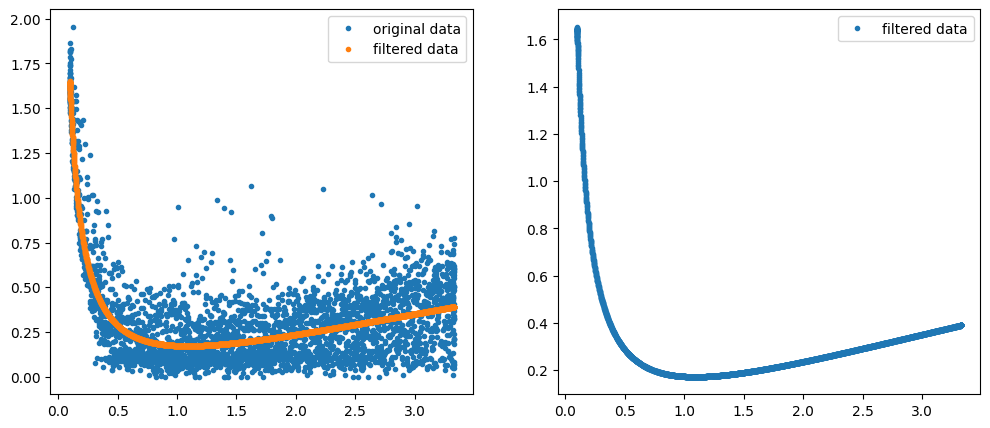

In [15]:
import scipy as sp

y_raw = raw_ir2

y_fit = ir2_fit
x_fit = ir2_x

def david_line(x,a,b):
    return a * x + b


# params, cov = sp.optimize.curve_fit(david_line, x_fit, y_fit)
# david_fit = david_line( x_fit, *params)


def myLS1(xvals, yvals):
    """
    linear least squares
    """
    x = np.array([xvals])
    y = np.array([yvals]).T
    o = np.array([np.ones(len(xvals))])
    A = np.concatenate((x, o), axis=0).T
    # print(A)
    m, c = np.linalg.lstsq(A, y, rcond=None)[0]
    return m, c


k = myLS1(distance,y_raw)
k1 = myLS1(x_fit,y_fit)


# def my_line(k,x):
#     return k[1] * x + k[0]


xx = x_fit ; yy = y_fit


# params, cov = sp.optimize.curve_fit(model1, xx, yy)
# yy = model1(xx, *params)

# fig, ax = plt.subplots(1,2)
fig, ax = plt.subplots(1, 2, figsize=(12, 5))  # Specify figsize
# data point 
ax[0].plot(distance,y_raw, '.', alpha=1, label='original data')
# original data fit

ax[0].plot(xx,yy, '.', alpha=1, label='filtered data')
# ax[0].plot(distance,my_line(k,distance) - 0.2)


# filtered data
ax[1].plot(xx,yy, '.', alpha=1, label='filtered data')
# filtered data fit

# ax[1].plot(x_fit,my_line(k1,x_fit))
# ax[1].plot(x_fit,david_fit)

ax[0].legend()
ax[1].legend()


# Tangenta line 

In [1]:
# Michael P. Hayes UCECE, Copyright 2018--2019
import numpy as np
from ipywidgets import interact, interactive, fixed
from David_SENSOR.lib.signal_plot import signal_plot
matplotlib.style.use('default')  # Graph white background 


def linearise_demo1_plot(x0=1, *params):

    Nx = 201
    x = np.linspace(0, 10, Nx)

    # k1 = 10
    # k2 = 1
    k1 = params[0]
    k2 = params[1]
    
    
    h = k1 / (k2 + x)

    # H 方程的倒数/斜率
    J = -k1 / (k2 + x0)**2 

    h2 = J * (x - x0) + k1 / (k2 + x0)

    fig = signal_plot(x, h)
    ax = fig.axes[0]
    ax.set_xlabel('$x$')    
    ax.plot(x, h2)
    ax.set_ylim(0, k1)
    
linearise_demo1_plot(1, *ir3_params)


# def linearise_demo1():
    # interact(linearise_demo1_plot, x0=(0, 10))
    
    
# linearise_demo1()

# linearise_demo1_plot(x0=1, *ir3_params)

NameError: name 'ir3_params' is not defined